<a href="https://colab.research.google.com/github/Taweilo/autogpt_podcast_maker/blob/main/AutoGPT_for_podcat.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# AutoGPT as A podcast maker
Develop an AutoGPT-powered podcast-making system using LangChain, where AI agents work together to generate engaging, high-quality 3-minute podcasts on any complex topic, making them easy to understand.

## Agents & Responsibilities
1. Supervisor: Defines topic and agenda for the podcast

2. Copywriter: Creates a script from supervisors's agenda

3. Designer: Generates a podcast cover image promt


## Workflow & Rules

### Step 1: Agenda Creation (Supervisor)
- Defines an agenda (e.g., Introduction, Challenges, Benefits, Future Trends)
#### Rules:
✅ Ensure the topic is engaging and relevant <br>
✅ The agenda must logically flow for clarity <br>
✅ Keep the tone consistent throughout the podcast

### Step 2: Full Script Production (Copywriter)
- Expands the short script into a 3-minute podcast script
#### Rules:
✅ Keep sentences short and natural for narration <br>
✅ Use examples, analogies, or real-world applications <br>
✅ Ensure each segment flows smoothly <br>

### Step 3: Multimedia Production (Designer)
- Generates a podcast cover image prompt
#### Rules:
✅ 70 characters <br>
✅ clearly convey a strong visual concept



In [1]:
!pip install langchain langchain-community openai wikipedia

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 95.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 kB 5.8 MB/s eta 0:00:00
  Created wheel for wikipedia: filename=wikipedia-1.4.0-py3-none-any.whl size=11679 sha256=a658a0695ddf1a40fc4282ca009bddce0f427a33f6a91a747e7e85f8be0945a1
  Stored in directory: /root/.cache/pip/wheels/8f/ab/cb/45ccc40522d3a1c41e1d2ad53b8f33a62f394011ec38cd71c6
Successfully built wikipedia


In [3]:
import os
import openai  # Ensure OpenAI's library is used
from langchain.llms import OpenAI
from langchain.prompts import PromptTemplate
from langchain.chains import LLMChain
from langchain.memory import ConversationBufferMemory
from langchain.utilities import WikipediaAPIWrapper  # Ensure Wikipedia wrapper is properly imported
from google.colab import userdata  # Only required in Google Colab

# Set API Key
os.environ['OPENAI_API_KEY'] = userdata.get('openai')  # Ensure this is set properly

# Shared Memory Buffer
shared_memory = ConversationBufferMemory(input_key="topic", memory_key="project_history")

# Wikipedia API Wrapper
wiki = WikipediaAPIWrapper()


# Prompt Templates
supervisor_template = PromptTemplate(
    input_variables=["topic", "tone"],
    template="You are a podcast supervisor. Your role help to create a quality three-minute solo podcast episode. "
             "Generate an overall podcast agenda, your copywriter will extend the script based on your agenda. Make sure the agend is relevant to {topic} and the agenda flows logically, suitable for solo podcast."
             "On the topic '{topic}' with a {tone} tone. Include notes to make the podcast well-structured."
)

copywriter_template = PromptTemplate(
    input_variables=["topic", "agenda", "tone"],
    template="You are a copywriter. Your task is to create an engaging, three-minute solo podcast '(one person script)' script based on the topic '{topic}' and agenda: {agenda}. The tone should be {tone}."
            "The script must be written in a conversational and natural style, suitable for a single speaker. Ensure smooth transitions between ideas and maintain audience engagement throughout."
            "The script should be formatted as continuous spoken text with no structural elements such as section headings, bullet points, time markers, or speaker namesn, 'name', summary, page or guest speaker."
            "It should be designed purely for audio delivery and should not include any references to 'sound effects', 'background music', or 'production notes'."
            "Focus on keeping the narration fluid, engaging, and easy to follow, avoiding any rigid or overly structured formatting."
)


designer_template = PromptTemplate(
    input_variables=["topic"],
    template="You are a visual designer creating an AI-generated podcast cover. Your task is to craft a concise, vivid, and descriptive image prompt for '{topic}'."
             "The prompt should be within 70 characters and clearly convey a strong visual concept suitable for AI image generation. Ensure it captures the essence of the topic in an engaging and visually appealing way."
)

# LLM Model
llm = OpenAI(temperature=0.7)

# Define Chains
supervisor_chain = LLMChain(llm=llm, prompt=supervisor_template, memory=shared_memory)
copywriter_chain = LLMChain(llm=llm, prompt=copywriter_template, memory=shared_memory)
designer_chain = LLMChain(llm=llm, prompt=designer_template, memory=shared_memory)

def run_podcast_pipeline(topic, tone="casual"):
    # Step 1: Generate Agenda
    agenda = supervisor_chain.run(topic=topic, tone=tone)
    print("\nGenerated Agenda:\n", agenda)

    # Step 2: Generate script with Wikipedia Data
    wiki_data = wiki.run(topic)  # Fetch Wikipedia data
    full_script = copywriter_chain.run(topic=topic, agenda=agenda, tone=tone) + "\n\n" + wiki_data
    print("\nGenerated full script:\n", full_script[:500] + "...")  # Print only first 500 chars for preview

    # Step 3: Generate Image Prompt
    image_prompt = designer_chain.run(topic=topic)
    print("\nGenerated Image Prompt:\n", image_prompt)

    print("\nPodcast Pipeline Completed!")
    return {
        "topic": topic,
        "agenda": agenda,
        "full_script": full_script,
        "image_prompt": image_prompt
    }

# Example Execution
output = run_podcast_pipeline(topic="The Future of AI in Healthcare", tone="casual")


Generated Agenda:
 

Overall Podcast Agenda:

Introduction:
- Welcome listeners and introduce the topic of the podcast: The Future of AI in Healthcare
- Briefly explain what AI is and its current role in healthcare
- Mention the potential impact of AI on the healthcare industry

Body:
- Discuss how AI is currently being used in healthcare:
    - Diagnostic tools and decision-making support
    - Electronic health records and data management
    - Drug development and clinical trials
- Highlight the benefits of AI in healthcare:
    - Increased efficiency and accuracy in diagnosis and treatment
    - Cost savings for patients and healthcare providers
    - Improved patient outcomes and personalized medicine
- Address concerns and challenges surrounding the use of AI in healthcare:
    - Data privacy and security
    - Ethical considerations
    - Potential job displacement for healthcare professionals
- Discuss the future of AI in healthcare:
    - Predicted advancements and innovation

In [4]:
import json

# Save output to a text file in JSON format
with open("podcast_proposal.json", "w", encoding="utf-8") as file:
    json.dump(output, file, ensure_ascii=False, indent=4)

print("Output saved as output.json")

Output saved as output.json


## Create the content
- Image
- Podcast audio

- Text to image: https://huggingface.co/CompVis/stable-diffusion-v1-4?text=A+small+cabin+on+top+of+a+snowy+mountain+in+the+style+of+Disney%2C+artstation

In [5]:
!pip install -U diffusers

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

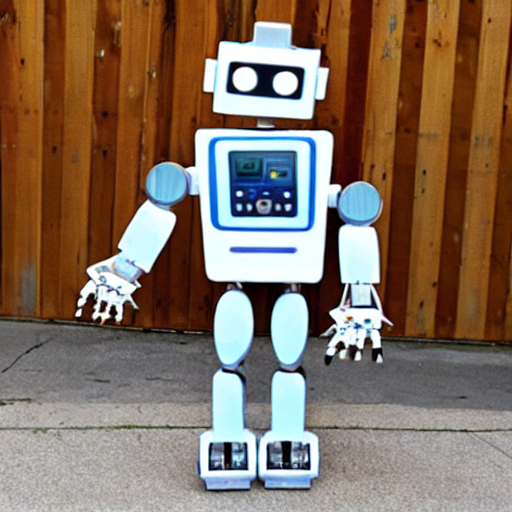

In [6]:
import torch
from diffusers import StableDiffusionPipeline
from IPython.display import display
from PIL import Image

model_id = "CompVis/stable-diffusion-v1-4"
device = "cuda"


pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to(device)

prompt = "a robot"
#prompt = "a photo of an astronaut riding a horse on mars"
image = pipe(prompt).images[0]

image.save("podcast.png")

# Display the image in Google Colab
display(image)

- Text to audio: https://huggingface.co/hexgrad/Kokoro-82M

In [7]:
output['full_script']

"\n\n[Opening music fades in and out]\n\nHost: Hello and welcome to our podcast, where we explore the latest advancements and innovations in healthcare. Today, we will be discussing a topic that has been making waves in the industry - The Future of AI in Healthcare. I'm your host, [Name], and I'm excited to dive into this fascinating subject with you.\n\n[Music fades out]\n\nHost: Before we get started, let's quickly define what AI is. AI, or artificial intelligence, is the simulation of human intelligence processes by machines, especially computer systems. In healthcare, AI is being used to analyze vast amounts of data and assist in decision-making, ultimately revolutionizing the way we approach healthcare.\n\n[Music fades in]\n\nHost: So, what exactly is the current role of AI in healthcare? Well, it's already being used in various ways, such as diagnostic tools and decision-making support, electronic health records and data management, and even drug development and clinical trials. 

In [ ]:
import json

# Define file path
file_path = '/content/podcast proposal.txt'

# Read the file content
with open(file_path, 'r') as file:
    output = json.load(file)  # Assuming the file is in JSON format

# Print only the script
print(output["full_script"])



[INTRO MUSIC]

Hello and welcome to today's solo podcast on the future of AI in healthcare. As we all know, technology has been rapidly advancing in all aspects of our lives, and the healthcare industry is no exception. Today, we will be discussing the potential impact of AI in shaping the future of healthcare and the ethical concerns surrounding its use.

But first, let's start with the basics. What is AI in healthcare? AI, or Artificial Intelligence, is the simulation of human intelligence processes by machines, particularly computer systems. In healthcare, AI is used to analyze complex medical data, make diagnoses, and even assist in surgeries. It has the potential to revolutionize the way we approach healthcare.

The potential benefits of AI in healthcare are numerous. It can help improve the accuracy and speed of diagnoses, leading to quicker treatment and better outcomes for patients. AI can also assist in predicting and preventing diseases, helping healthcare professionals to 

In [8]:
import re

# Sample full_script
full_script = output['full_script']

# Remove all occurrences of text inside square brackets along with the brackets
cleaned_script = re.sub(r'\[.*?\]', '', full_script)

print(cleaned_script)





Host: Hello and welcome to our podcast, where we explore the latest advancements and innovations in healthcare. Today, we will be discussing a topic that has been making waves in the industry - The Future of AI in Healthcare. I'm your host, , and I'm excited to dive into this fascinating subject with you.



Host: Before we get started, let's quickly define what AI is. AI, or artificial intelligence, is the simulation of human intelligence processes by machines, especially computer systems. In healthcare, AI is being used to analyze vast amounts of data and assist in decision-making, ultimately revolutionizing the way we approach healthcare.



Host: So, what exactly is the current role of AI in healthcare? Well, it's already being used in various ways, such as diagnostic tools and decision-making support, electronic health records and data management, and even drug development and clinical trials. AI has the potential to improve the efficiency and accuracy of these processes, ulti

In [4]:
script = """Hello and welcome to our podcast, where we explore the latest advancements and innovations in healthcare.
Today, we will be discussing a topic that has been making waves in the industry—The Future of AI in Healthcare.
I'm your host, [Your Name], and I'm excited to dive into this fascinating subject with you.

Before we get started, let's quickly define what AI is. AI, or artificial intelligence, is the simulation of human
intelligence processes by machines, especially computer systems. In healthcare, AI is being used to analyze vast
amounts of data and assist in decision-making, ultimately revolutionizing the way we approach healthcare.

Artificial intelligence in healthcare is the application of AI to analyze and understand complex medical and healthcare data.
In some cases, it can exceed or augment human capabilities by providing better or faster ways to diagnose, treat, or prevent disease.
Since widespread AI use in healthcare is relatively new, research is ongoing into its application across various medical disciplines.
AI is being applied in areas such as:
- Diagnostics
- Treatment protocol development
- Drug development
- Personalized medicine
- Patient monitoring and care

Because radiographs are one of the most common imaging tests in radiology, AI's potential in triage and interpretation of radiographs
is particularly noteworthy.

However, using AI also presents ethical concerns, including:
- Data privacy issues
- Automation of jobs
- The risk of amplifying biases
- Resistance from healthcare leaders leading to slow adoption

Furthermore, there have been instances where AI was deployed in healthcare without proper testing. A 2023 systematic review and thematic
analysis showed that most stakeholders—including health professionals, patients, and the general public—doubted whether AI-driven
care could be empathetic. Meta-studies have also found that the scientific literature on AI in healthcare often lacks reproducibility.

Additionally, the concept of an AI takeover is often discussed in both science fiction and serious AI safety conversations.
An AI takeover is a hypothetical scenario where AI surpasses human intelligence and gains control over society. Possible outcomes
could include mass automation, artificial superintelligence (ASI) taking control, or even a robot uprising.

While AI takeovers remain speculative, notable figures like Stephen Hawking and Elon Musk have advocated for precautionary measures
to ensure that future AI systems remain under human control.

Thank you for joining today’s discussion. AI in healthcare is a rapidly evolving field, and we will continue exploring its
opportunities and challenges in future episodes. Stay tuned and stay informed!"""

In [3]:
!pip install pydub soundfile
# 1️⃣ Install kokoro
!pip install -q kokoro>=0.3.4 soundfile
# 2️⃣ Install espeak, used for English OOD fallback and some non-English languages
!apt-get -qq -y install espeak-ng > /dev/null 2>&1

In [5]:
from pydub import AudioSegment
import soundfile as sf
from IPython.display import Audio
from transformers import pipeline
from kokoro import KPipeline
from IPython.display import display, Audio
import soundfile as sf

# Sample text input
text = script

pipeline = KPipeline(lang_code='a')
# Initialize the TTS pipeline
generator = pipeline(
    text, voice='af_heart',  # <= Change voice here
    speed=1, split_pattern=r'\n+'
)

# Step 1: Generate and Save Individual Audio Files
audio_files = []
for i, (gs, ps, audio) in enumerate(generator):
    print(f"Processing segment {i}")
    sf.write(f"{i}.wav", audio, 24000)  # Save each segment
    audio_files.append(f"{i}.wav")  # Store filename

# Step 2: Merge All Audio Files
if audio_files:
    final_audio = AudioSegment.from_wav(audio_files[0])  # Load the first file

    for file in audio_files[1:]:
        audio_segment = AudioSegment.from_wav(file)
        final_audio += audio_segment  # Concatenate

    # Save merged audio
    final_audio.export("final_podcast.wav", format="wav")
    print("Merged audio saved as final_podcast.wav")

# Step 3: Play the merged audio (optional)
display(Audio("final_podcast.wav", rate=24000))

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/rnn.py:123: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/utils/weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, di

af_heart.pt:   0%|          | 0.00/523k [00:00<?, ?B/s]

Processing segment 0
Processing segment 1
Processing segment 2
Processing segment 3
Processing segment 4
Processing segment 5
Processing segment 6
Processing segment 7


Processing segment 8
Processing segment 9


Processing segment 10
Processing segment 11


Processing segment 12
Processing segment 13
Processing segment 14
Processing segment 15


Processing segment 16
Processing segment 17
Processing segment 18
Processing segment 19
Processing segment 20
Processing segment 21
Processing segment 22
Processing segment 23
Processing segment 24
Processing segment 25
Processing segment 26
Processing segment 27
Processing segment 28
Processing segment 29
Processing segment 30
Processing segment 31
Merged audio saved as final_podcast.wav


- Reference: https://www.youtube.com/watch?v=MlK6SIjcjE8
- Further application: https://www.youtube.com/watch?v=nqqcBby7q10